**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SwinUNETR
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings


In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints"
log_dir = "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs"

Checkpoints will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin UNETR/Federated_SwinUNETR_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 17176), started 1:41:22 ago. (Use '!kill 17176' to kill it.)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 33 | Image shape: (112, 112, 75) | Mask shape: (112, 112, 75) | Mask Values: tensor([0.], dtype=torch.float64)


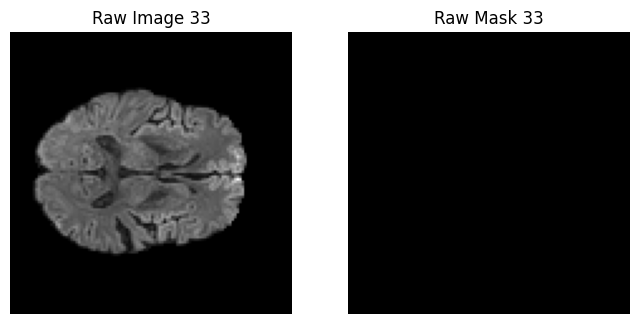

Sample 23 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


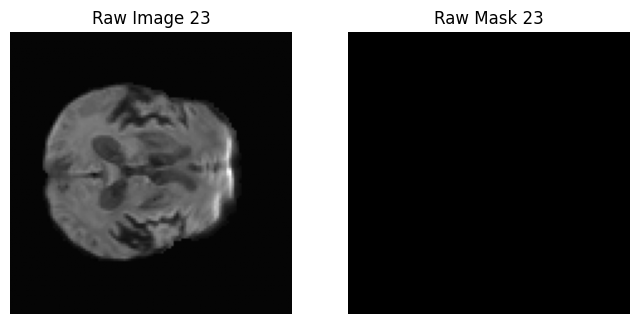

Client 0 - Preprocessed Samples:
Sample 33 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0])


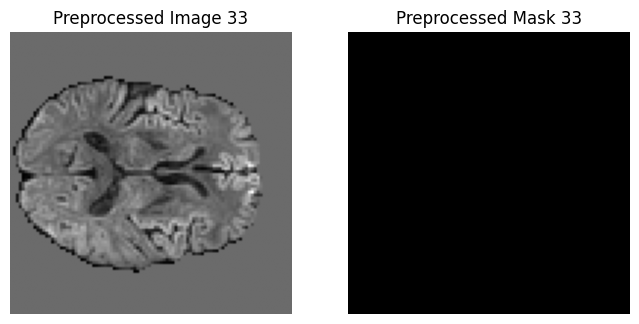

Sample 23 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


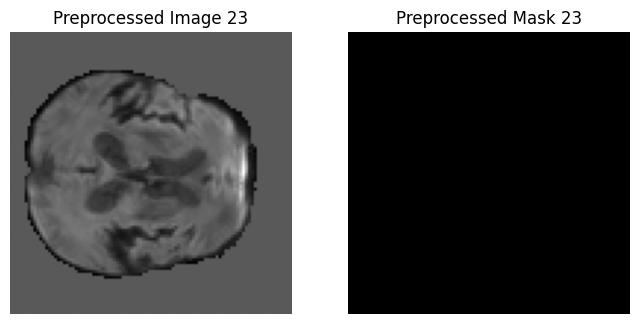

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 32 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


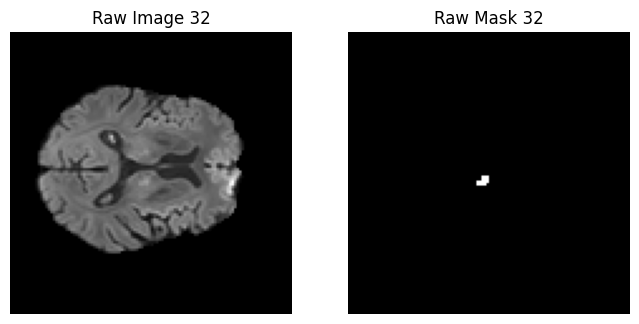

Sample 20 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


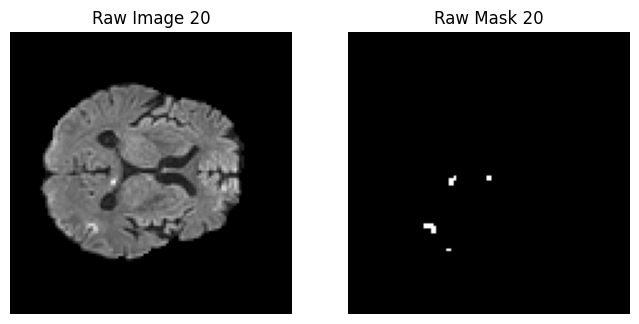

Client 1 - Preprocessed Samples:
Sample 32 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


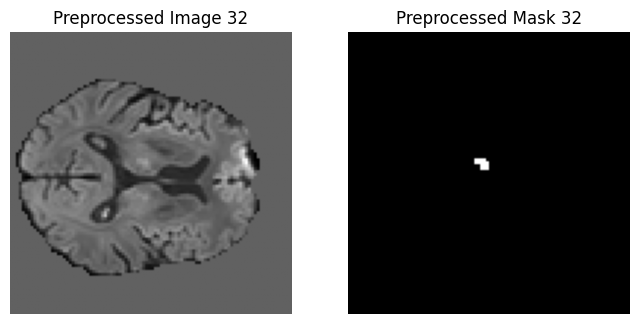

Sample 20 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


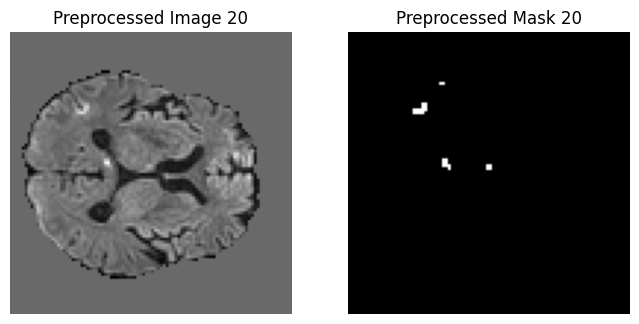

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 2 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


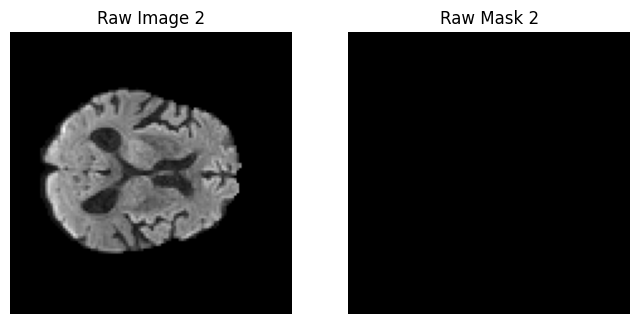

Sample 14 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


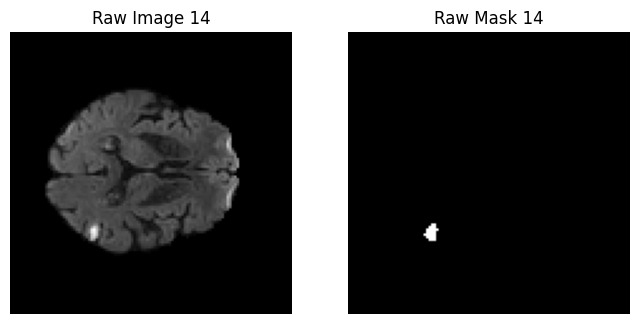

Client 2 - Preprocessed Samples:
Sample 2 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


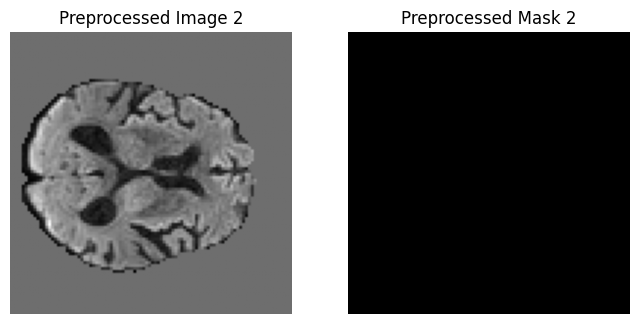

Sample 14 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


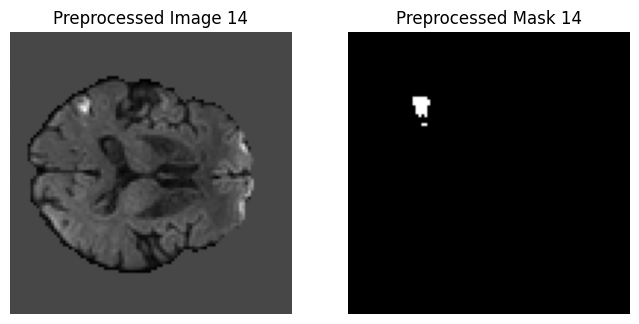

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin UNETR

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = SwinUNETR(
        in_channels=1,
        out_channels=1,
        feature_size=24,
        use_checkpoint=True
    ).to(device)

    print(model)
    return model

Using device: cuda


**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):

        new_params = {}

        for key in client_params_list[0].keys():

            # If parameter is integer type → just copy from first client
            if client_params_list[0][key].dtype == torch.long:
                new_params[key] = client_params_list[0][key]
                continue

            # Average float parameters
            new_params[key] = client_params_list[0][key].clone()

            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]

            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)
    # def aggregate(self, client_params_list):
    #     new_params = copy.deepcopy(client_params_list[0])

    #     for key in new_params.keys():
    #         for i in range(1, len(client_params_list)):
    #             new_params[key] += client_params_list[i][key]
    #         new_params[key] /= len(client_params_list)

    #     self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Linear(in_features=

**Federated Training loop**

In [ ]:
communication_rounds = 50  # upper bound
local_epochs = 5
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 5   # stop if Dice does not improve for 5 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.8668 | Dice: 0.0275 | IoU: 0.0139 | HD95: 48.3898


Client 0 | Epoch 2/5 | Loss: 0.8279 | Dice: 0.1682 | IoU: 0.0918 | HD95: 44.2134


Client 0 | Epoch 3/5 | Loss: 0.8094 | Dice: 0.2291 | IoU: 0.1294 | HD95: 39.5278


Client 0 | Epoch 4/5 | Loss: 0.7907 | Dice: 0.2349 | IoU: 0.1331 | HD95: 37.3986


Clients Training:  33%|███▎      | 1/3 [01:40<03:20, 100.11s/it]

Client 0 | Epoch 5/5 | Loss: 0.7788 | Dice: 0.2664 | IoU: 0.1537 | HD95: 37.2323
Client 0 | Loss=0.8147 | Dice=0.2664 | IoU=0.1537 | HD95=37.2323


Client 1 | Epoch 1/5 | Loss: 0.8662 | Dice: 0.0381 | IoU: 0.0194 | HD95: 44.0412


Client 1 | Epoch 2/5 | Loss: 0.8262 | Dice: 0.1848 | IoU: 0.1018 | HD95: 40.5223


Client 1 | Epoch 3/5 | Loss: 0.8033 | Dice: 0.2329 | IoU: 0.1318 | HD95: 38.6958


Client 1 | Epoch 4/5 | Loss: 0.7859 | Dice: 0.2695 | IoU: 0.1557 | HD95: 35.2974


Clients Training:  67%|██████▋   | 2/3 [03:31<01:46, 106.83s/it]

Client 1 | Epoch 5/5 | Loss: 0.7741 | Dice: 0.2888 | IoU: 0.1687 | HD95: 34.4169
Client 1 | Loss=0.8111 | Dice=0.2888 | IoU=0.1687 | HD95=34.4169


Client 2 | Epoch 1/5 | Loss: 0.8642 | Dice: 0.0696 | IoU: 0.0361 | HD95: 46.9816


Client 2 | Epoch 2/5 | Loss: 0.8238 | Dice: 0.2362 | IoU: 0.1339 | HD95: 43.4010


Client 2 | Epoch 3/5 | Loss: 0.8002 | Dice: 0.2659 | IoU: 0.1534 | HD95: 42.1255


Client 2 | Epoch 4/5 | Loss: 0.7817 | Dice: 0.3086 | IoU: 0.1825 | HD95: 40.0171


Client 2 Epochs: 100%|██████████| 5/5 [01:53<00:00, 22.78s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.7693 | Dice: 0.3387 | IoU: 0.2038 | HD95: 36.0796
Client 2 | Loss=0.8079 | Dice=0.3387 | IoU=0.2038 | HD95=36.0796


Best global model updated with Dice=0.2237
Global | Val Loss=0.7799 | Dice=0.2237 | IoU=0.1259 | HD95=42.0837
Checkpoint saved for round 1 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7697 | Dice: 0.2213 | IoU: 0.1244 | HD95: 37.3975


Client 0 | Epoch 2/5 | Loss: 0.7613 | Dice: 0.2565 | IoU: 0.1471 | HD95: 36.4683


Client 0 | Epoch 3/5 | Loss: 0.7552 | Dice: 0.2891 | IoU: 0.1690 | HD95: 36.1141


Client 0 | Epoch 4/5 | Loss: 0.7499 | Dice: 0.2790 | IoU: 0.1621 | HD95: 35.4679


Clients Training:  33%|███▎      | 1/3 [01:49<03:38, 109.11s/it]

Client 0 | Epoch 5/5 | Loss: 0.7445 | Dice: 0.3228 | IoU: 0.1924 | HD95: 35.8285
Client 0 | Loss=0.7561 | Dice=0.3228 | IoU=0.1924 | HD95=35.8285


Client 1 | Epoch 1/5 | Loss: 0.7677 | Dice: 0.2864 | IoU: 0.1672 | HD95: 34.8167


Client 1 | Epoch 2/5 | Loss: 0.7601 | Dice: 0.3209 | IoU: 0.1911 | HD95: 34.0141


Client 1 | Epoch 3/5 | Loss: 0.7547 | Dice: 0.3346 | IoU: 0.2009 | HD95: 32.1296


Client 1 | Epoch 4/5 | Loss: 0.7492 | Dice: 0.3542 | IoU: 0.2152 | HD95: 32.6361


Clients Training:  67%|██████▋   | 2/3 [03:37<01:48, 108.54s/it]

Client 1 | Epoch 5/5 | Loss: 0.7435 | Dice: 0.3701 | IoU: 0.2271 | HD95: 31.2745
Client 1 | Loss=0.7550 | Dice=0.3701 | IoU=0.2271 | HD95=31.2745


Client 2 | Epoch 1/5 | Loss: 0.7631 | Dice: 0.3414 | IoU: 0.2058 | HD95: 35.8613


Client 2 | Epoch 2/5 | Loss: 0.7554 | Dice: 0.3546 | IoU: 0.2155 | HD95: 35.9891


Client 2 | Epoch 3/5 | Loss: 0.7492 | Dice: 0.3840 | IoU: 0.2376 | HD95: 34.1031


Client 2 | Epoch 4/5 | Loss: 0.7437 | Dice: 0.3887 | IoU: 0.2413 | HD95: 33.7134


Client 2 Epochs: 100%|██████████| 5/5 [01:44<00:00, 20.80s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.7380 | Dice: 0.4072 | IoU: 0.2556 | HD95: 33.4586
Client 2 | Loss=0.7499 | Dice=0.4072 | IoU=0.2556 | HD95=33.4586


Best global model updated with Dice=0.2650
Global | Val Loss=0.7514 | Dice=0.2650 | IoU=0.1528 | HD95=40.2710
Checkpoint saved for round 2 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7412 | Dice: 0.3057 | IoU: 0.1804 | HD95: 34.6597


Client 0 | Epoch 2/5 | Loss: 0.7358 | Dice: 0.3218 | IoU: 0.1917 | HD95: 34.5161


Client 0 | Epoch 3/5 | Loss: 0.7302 | Dice: 0.3336 | IoU: 0.2002 | HD95: 33.7720


Client 0 | Epoch 4/5 | Loss: 0.7255 | Dice: 0.3570 | IoU: 0.2173 | HD95: 32.8511


Clients Training:  33%|███▎      | 1/3 [01:42<03:25, 102.60s/it]

Client 0 | Epoch 5/5 | Loss: 0.7211 | Dice: 0.3855 | IoU: 0.2388 | HD95: 31.7073
Client 0 | Loss=0.7308 | Dice=0.3855 | IoU=0.2388 | HD95=31.7073


Client 1 | Epoch 1/5 | Loss: 0.7406 | Dice: 0.3416 | IoU: 0.2059 | HD95: 31.2098


Client 1 | Epoch 2/5 | Loss: 0.7355 | Dice: 0.3576 | IoU: 0.2177 | HD95: 31.4100


Client 1 | Epoch 3/5 | Loss: 0.7301 | Dice: 0.3846 | IoU: 0.2381 | HD95: 30.3506


Client 1 | Epoch 4/5 | Loss: 0.7254 | Dice: 0.3961 | IoU: 0.2470 | HD95: 29.7997


Clients Training:  67%|██████▋   | 2/3 [03:25<01:42, 102.98s/it]

Client 1 | Epoch 5/5 | Loss: 0.7211 | Dice: 0.4485 | IoU: 0.2891 | HD95: 28.0140
Client 1 | Loss=0.7305 | Dice=0.4485 | IoU=0.2891 | HD95=28.0140


Client 2 | Epoch 1/5 | Loss: 0.7334 | Dice: 0.4099 | IoU: 0.2578 | HD95: 33.1807


Client 2 | Epoch 2/5 | Loss: 0.7285 | Dice: 0.4032 | IoU: 0.2525 | HD95: 32.7229


Client 2 | Epoch 3/5 | Loss: 0.7235 | Dice: 0.4359 | IoU: 0.2787 | HD95: 32.5642


Client 2 | Epoch 4/5 | Loss: 0.7190 | Dice: 0.4361 | IoU: 0.2788 | HD95: 32.1398


Client 2 Epochs: 100%|██████████| 5/5 [01:43<00:00, 20.68s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.7148 | Dice: 0.4474 | IoU: 0.2881 | HD95: 30.2858
Client 2 | Loss=0.7238 | Dice=0.4474 | IoU=0.2881 | HD95=30.2858


Best global model updated with Dice=0.3081
Global | Val Loss=0.7337 | Dice=0.3081 | IoU=0.1821 | HD95=39.4540
Checkpoint saved for round 3 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7231 | Dice: 0.3140 | IoU: 0.1863 | HD95: 32.3006


Client 0 | Epoch 2/5 | Loss: 0.7197 | Dice: 0.2946 | IoU: 0.1727 | HD95: 34.7149


Client 0 | Epoch 3/5 | Loss: 0.7125 | Dice: 0.3523 | IoU: 0.2138 | HD95: 33.9163


Client 0 | Epoch 4/5 | Loss: 0.7074 | Dice: 0.4035 | IoU: 0.2527 | HD95: 31.8303


Clients Training:  33%|███▎      | 1/3 [01:42<03:24, 102.40s/it]

Client 0 | Epoch 5/5 | Loss: 0.7040 | Dice: 0.4045 | IoU: 0.2535 | HD95: 31.3591
Client 0 | Loss=0.7133 | Dice=0.4045 | IoU=0.2535 | HD95=31.3591


Client 1 | Epoch 1/5 | Loss: 0.7183 | Dice: 0.3824 | IoU: 0.2364 | HD95: 29.2826


Client 1 | Epoch 2/5 | Loss: 0.7145 | Dice: 0.4204 | IoU: 0.2661 | HD95: 28.1592


Client 1 | Epoch 3/5 | Loss: 0.7105 | Dice: 0.4572 | IoU: 0.2964 | HD95: 27.9228


Client 1 | Epoch 4/5 | Loss: 0.7075 | Dice: 0.4278 | IoU: 0.2721 | HD95: 28.5085


Clients Training:  67%|██████▋   | 2/3 [03:25<01:42, 102.99s/it]

Client 1 | Epoch 5/5 | Loss: 0.7036 | Dice: 0.4461 | IoU: 0.2871 | HD95: 27.1125
Client 1 | Loss=0.7109 | Dice=0.4461 | IoU=0.2871 | HD95=27.1125


Client 2 | Epoch 1/5 | Loss: 0.7116 | Dice: 0.4293 | IoU: 0.2734 | HD95: 30.1269


Client 2 | Epoch 2/5 | Loss: 0.7081 | Dice: 0.4510 | IoU: 0.2911 | HD95: 30.7973


Client 2 | Epoch 3/5 | Loss: 0.7052 | Dice: 0.4369 | IoU: 0.2795 | HD95: 31.8802


Client 2 | Epoch 4/5 | Loss: 0.7001 | Dice: 0.4650 | IoU: 0.3029 | HD95: 27.8746


Client 2 Epochs: 100%|██████████| 5/5 [01:43<00:00, 20.60s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6961 | Dice: 0.4884 | IoU: 0.3231 | HD95: 25.2720
Client 2 | Loss=0.7042 | Dice=0.4884 | IoU=0.3231 | HD95=25.2720


Best global model updated with Dice=0.3393
Global | Val Loss=0.7203 | Dice=0.3393 | IoU=0.2043 | HD95=35.6845
Checkpoint saved for round 4 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7007 | Dice: 0.4013 | IoU: 0.2510 | HD95: 29.9598


Client 0 | Epoch 2/5 | Loss: 0.6978 | Dice: 0.4164 | IoU: 0.2629 | HD95: 31.0314


Client 0 | Epoch 3/5 | Loss: 0.6939 | Dice: 0.4659 | IoU: 0.3037 | HD95: 27.1369


Client 0 | Epoch 4/5 | Loss: 0.6927 | Dice: 0.4321 | IoU: 0.2756 | HD95: 29.4490


Clients Training:  33%|███▎      | 1/3 [01:42<03:25, 102.54s/it]

Client 0 | Epoch 5/5 | Loss: 0.6896 | Dice: 0.4087 | IoU: 0.2569 | HD95: 28.4046
Client 0 | Loss=0.6949 | Dice=0.4087 | IoU=0.2569 | HD95=28.4046


Client 1 | Epoch 1/5 | Loss: 0.7016 | Dice: 0.4392 | IoU: 0.2814 | HD95: 27.2740


Client 1 | Epoch 2/5 | Loss: 0.6988 | Dice: 0.4568 | IoU: 0.2960 | HD95: 26.2096


Client 1 | Epoch 3/5 | Loss: 0.6950 | Dice: 0.4619 | IoU: 0.3003 | HD95: 26.0993


Client 1 | Epoch 4/5 | Loss: 0.6912 | Dice: 0.4858 | IoU: 0.3208 | HD95: 26.1180


Clients Training:  67%|██████▋   | 2/3 [03:25<01:43, 103.01s/it]

Client 1 | Epoch 5/5 | Loss: 0.6879 | Dice: 0.4912 | IoU: 0.3256 | HD95: 25.7240
Client 1 | Loss=0.6949 | Dice=0.4912 | IoU=0.3256 | HD95=25.7240


Client 2 | Epoch 1/5 | Loss: 0.6939 | Dice: 0.4550 | IoU: 0.2945 | HD95: 27.1067


Client 2 | Epoch 2/5 | Loss: 0.6903 | Dice: 0.4766 | IoU: 0.3129 | HD95: 27.8765


Client 2 | Epoch 3/5 | Loss: 0.6873 | Dice: 0.4675 | IoU: 0.3050 | HD95: 25.6321


Client 2 | Epoch 4/5 | Loss: 0.6847 | Dice: 0.4684 | IoU: 0.3058 | HD95: 27.9227


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.57s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6800 | Dice: 0.5031 | IoU: 0.3361 | HD95: 24.1777
Client 2 | Loss=0.6873 | Dice=0.5031 | IoU=0.3361 | HD95=24.1777


Best global model updated with Dice=0.3561
Global | Val Loss=0.7091 | Dice=0.3561 | IoU=0.2166 | HD95=33.5873
Checkpoint saved for round 5 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6857 | Dice: 0.4639 | IoU: 0.3020 | HD95: 29.3688


Client 0 | Epoch 2/5 | Loss: 0.6825 | Dice: 0.4811 | IoU: 0.3167 | HD95: 28.5505


Client 0 | Epoch 3/5 | Loss: 0.6794 | Dice: 0.4941 | IoU: 0.3281 | HD95: 28.3372


Client 0 | Epoch 4/5 | Loss: 0.6759 | Dice: 0.5230 | IoU: 0.3541 | HD95: 25.6679


Clients Training:  33%|███▎      | 1/3 [01:42<03:24, 102.31s/it]

Client 0 | Epoch 5/5 | Loss: 0.6720 | Dice: 0.5166 | IoU: 0.3483 | HD95: 25.1361
Client 0 | Loss=0.6791 | Dice=0.5166 | IoU=0.3483 | HD95=25.1361


Client 1 | Epoch 1/5 | Loss: 0.6857 | Dice: 0.4988 | IoU: 0.3323 | HD95: 26.0943


Client 1 | Epoch 2/5 | Loss: 0.6826 | Dice: 0.4870 | IoU: 0.3219 | HD95: 23.6789


Client 1 | Epoch 3/5 | Loss: 0.6793 | Dice: 0.5057 | IoU: 0.3384 | HD95: 25.0613


Client 1 | Epoch 4/5 | Loss: 0.6755 | Dice: 0.5191 | IoU: 0.3505 | HD95: 21.5997


Clients Training:  67%|██████▋   | 2/3 [03:24<01:42, 102.41s/it]

Client 1 | Epoch 5/5 | Loss: 0.6711 | Dice: 0.5267 | IoU: 0.3575 | HD95: 20.7554
Client 1 | Loss=0.6788 | Dice=0.5267 | IoU=0.3575 | HD95=20.7554


Client 2 | Epoch 1/5 | Loss: 0.6773 | Dice: 0.5039 | IoU: 0.3368 | HD95: 23.9371


Client 2 | Epoch 2/5 | Loss: 0.6737 | Dice: 0.5207 | IoU: 0.3520 | HD95: 24.4294


Client 2 | Epoch 3/5 | Loss: 0.6700 | Dice: 0.5168 | IoU: 0.3484 | HD95: 21.8079


Client 2 | Epoch 4/5 | Loss: 0.6655 | Dice: 0.5425 | IoU: 0.3722 | HD95: 19.9703


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.51s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6608 | Dice: 0.5612 | IoU: 0.3901 | HD95: 19.9267
Client 2 | Loss=0.6695 | Dice=0.5612 | IoU=0.3901 | HD95=19.9267


Best global model updated with Dice=0.4647
Global | Val Loss=0.6979 | Dice=0.4647 | IoU=0.3027 | HD95=30.9687
Checkpoint saved for round 6 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6685 | Dice: 0.5110 | IoU: 0.3432 | HD95: 28.8343


Client 0 | Epoch 2/5 | Loss: 0.6648 | Dice: 0.5066 | IoU: 0.3392 | HD95: 26.0392


Client 0 | Epoch 3/5 | Loss: 0.6619 | Dice: 0.5262 | IoU: 0.3570 | HD95: 26.5135


Client 0 | Epoch 4/5 | Loss: 0.6584 | Dice: 0.5432 | IoU: 0.3729 | HD95: 24.9400


Clients Training:  33%|███▎      | 1/3 [01:41<03:23, 101.89s/it]

Client 0 | Epoch 5/5 | Loss: 0.6564 | Dice: 0.5243 | IoU: 0.3553 | HD95: 25.4888
Client 0 | Loss=0.6620 | Dice=0.5243 | IoU=0.3553 | HD95=25.4888


Client 1 | Epoch 1/5 | Loss: 0.6680 | Dice: 0.5414 | IoU: 0.3711 | HD95: 20.2555


Client 1 | Epoch 2/5 | Loss: 0.6666 | Dice: 0.4630 | IoU: 0.3013 | HD95: 24.8899


Client 1 | Epoch 3/5 | Loss: 0.6616 | Dice: 0.5079 | IoU: 0.3404 | HD95: 24.6289


Client 1 | Epoch 4/5 | Loss: 0.6575 | Dice: 0.5430 | IoU: 0.3727 | HD95: 19.8109


Clients Training:  67%|██████▋   | 2/3 [03:24<01:42, 102.32s/it]

Client 1 | Epoch 5/5 | Loss: 0.6535 | Dice: 0.5367 | IoU: 0.3667 | HD95: 19.6842
Client 1 | Loss=0.6614 | Dice=0.5367 | IoU=0.3667 | HD95=19.6842


Client 2 | Epoch 1/5 | Loss: 0.6579 | Dice: 0.5467 | IoU: 0.3762 | HD95: 19.9243


Client 2 | Epoch 2/5 | Loss: 0.6542 | Dice: 0.5430 | IoU: 0.3727 | HD95: 22.2720


Client 2 | Epoch 3/5 | Loss: 0.6500 | Dice: 0.5295 | IoU: 0.3601 | HD95: 20.5884


Client 2 | Epoch 4/5 | Loss: 0.6463 | Dice: 0.5531 | IoU: 0.3822 | HD95: 19.1562


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.48s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6421 | Dice: 0.5633 | IoU: 0.3921 | HD95: 19.6527
Client 2 | Loss=0.6501 | Dice=0.5633 | IoU=0.3921 | HD95=19.6527


Best global model updated with Dice=0.4723
Global | Val Loss=0.6863 | Dice=0.4723 | IoU=0.3091 | HD95=32.7145
Checkpoint saved for round 7 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6519 | Dice: 0.5444 | IoU: 0.3740 | HD95: 26.0821


Client 0 | Epoch 2/5 | Loss: 0.6476 | Dice: 0.5231 | IoU: 0.3542 | HD95: 26.4578


Client 0 | Epoch 3/5 | Loss: 0.6434 | Dice: 0.5716 | IoU: 0.4002 | HD95: 23.0282


Client 0 | Epoch 4/5 | Loss: 0.6411 | Dice: 0.5371 | IoU: 0.3672 | HD95: 23.9475


Clients Training:  33%|███▎      | 1/3 [01:42<03:24, 102.49s/it]

Client 0 | Epoch 5/5 | Loss: 0.6371 | Dice: 0.5338 | IoU: 0.3641 | HD95: 24.1625
Client 0 | Loss=0.6442 | Dice=0.5338 | IoU=0.3641 | HD95=24.1625


Client 1 | Epoch 1/5 | Loss: 0.6493 | Dice: 0.5750 | IoU: 0.4035 | HD95: 18.3822


Client 1 | Epoch 2/5 | Loss: 0.6455 | Dice: 0.5556 | IoU: 0.3847 | HD95: 18.9801


Client 1 | Epoch 3/5 | Loss: 0.6427 | Dice: 0.5429 | IoU: 0.3726 | HD95: 21.3208


Client 1 | Epoch 4/5 | Loss: 0.6380 | Dice: 0.5507 | IoU: 0.3800 | HD95: 20.4892


Clients Training:  67%|██████▋   | 2/3 [03:25<01:42, 102.92s/it]

Client 1 | Epoch 5/5 | Loss: 0.6320 | Dice: 0.5697 | IoU: 0.3983 | HD95: 17.3220
Client 1 | Loss=0.6415 | Dice=0.5697 | IoU=0.3983 | HD95=17.3220


Client 2 | Epoch 1/5 | Loss: 0.6380 | Dice: 0.5722 | IoU: 0.4007 | HD95: 18.9655


Client 2 | Epoch 2/5 | Loss: 0.6335 | Dice: 0.5602 | IoU: 0.3890 | HD95: 21.0516


Client 2 | Epoch 3/5 | Loss: 0.6324 | Dice: 0.5415 | IoU: 0.3713 | HD95: 21.0518


Client 2 | Epoch 4/5 | Loss: 0.6261 | Dice: 0.5596 | IoU: 0.3885 | HD95: 25.1010


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.47s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6192 | Dice: 0.5893 | IoU: 0.4178 | HD95: 19.0016
Client 2 | Loss=0.6298 | Dice=0.5893 | IoU=0.4178 | HD95=19.0016


Global | Val Loss=0.6722 | Dice=0.4501 | IoU=0.2904 | HD95=30.4798
Checkpoint saved for round 8 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round8.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6318 | Dice: 0.5757 | IoU: 0.4042 | HD95: 22.7045


Client 0 | Epoch 2/5 | Loss: 0.6280 | Dice: 0.5963 | IoU: 0.4248 | HD95: 21.0377


Client 0 | Epoch 3/5 | Loss: 0.6241 | Dice: 0.6001 | IoU: 0.4287 | HD95: 21.6534


Client 0 | Epoch 4/5 | Loss: 0.6202 | Dice: 0.6058 | IoU: 0.4345 | HD95: 20.8337


Clients Training:  33%|███▎      | 1/3 [01:41<03:23, 101.61s/it]

Client 0 | Epoch 5/5 | Loss: 0.6169 | Dice: 0.6117 | IoU: 0.4406 | HD95: 18.3328
Client 0 | Loss=0.6242 | Dice=0.6117 | IoU=0.4406 | HD95=18.3328


Client 1 | Epoch 1/5 | Loss: 0.6286 | Dice: 0.5963 | IoU: 0.4248 | HD95: 17.2118


Client 1 | Epoch 2/5 | Loss: 0.6245 | Dice: 0.5824 | IoU: 0.4109 | HD95: 17.6514


Client 1 | Epoch 3/5 | Loss: 0.6204 | Dice: 0.5729 | IoU: 0.4014 | HD95: 16.7803


Client 1 | Epoch 4/5 | Loss: 0.6149 | Dice: 0.6074 | IoU: 0.4361 | HD95: 15.5583


Clients Training:  67%|██████▋   | 2/3 [03:23<01:41, 101.68s/it]

Client 1 | Epoch 5/5 | Loss: 0.6114 | Dice: 0.5771 | IoU: 0.4056 | HD95: 15.8359
Client 1 | Loss=0.6200 | Dice=0.5771 | IoU=0.4056 | HD95=15.8359


Client 2 | Epoch 1/5 | Loss: 0.6145 | Dice: 0.6074 | IoU: 0.4362 | HD95: 17.3601


Client 2 | Epoch 2/5 | Loss: 0.6093 | Dice: 0.5984 | IoU: 0.4269 | HD95: 16.2454


Client 2 | Epoch 3/5 | Loss: 0.6043 | Dice: 0.6208 | IoU: 0.4501 | HD95: 16.2603


Client 2 | Epoch 4/5 | Loss: 0.5995 | Dice: 0.6200 | IoU: 0.4493 | HD95: 16.8574


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.41s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5941 | Dice: 0.6184 | IoU: 0.4476 | HD95: 16.2476
Client 2 | Loss=0.6044 | Dice=0.6184 | IoU=0.4476 | HD95=16.2476


Best global model updated with Dice=0.5070
Global | Val Loss=0.6589 | Dice=0.5070 | IoU=0.3395 | HD95=26.7448
Checkpoint saved for round 9 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6119 | Dice: 0.6085 | IoU: 0.4373 | HD95: 19.3509


Client 0 | Epoch 2/5 | Loss: 0.6097 | Dice: 0.5770 | IoU: 0.4054 | HD95: 23.4374


Client 0 | Epoch 3/5 | Loss: 0.6059 | Dice: 0.5922 | IoU: 0.4207 | HD95: 22.0561


Client 0 | Epoch 4/5 | Loss: 0.6012 | Dice: 0.6222 | IoU: 0.4516 | HD95: 18.0412


Clients Training:  33%|███▎      | 1/3 [01:41<03:22, 101.38s/it]

Client 0 | Epoch 5/5 | Loss: 0.5956 | Dice: 0.6191 | IoU: 0.4483 | HD95: 18.0704
Client 0 | Loss=0.6049 | Dice=0.6191 | IoU=0.4483 | HD95=18.0704


Client 1 | Epoch 1/5 | Loss: 0.6062 | Dice: 0.6271 | IoU: 0.4568 | HD95: 13.2570


Client 1 | Epoch 2/5 | Loss: 0.6017 | Dice: 0.6202 | IoU: 0.4494 | HD95: 13.5463


Client 1 | Epoch 3/5 | Loss: 0.5976 | Dice: 0.6333 | IoU: 0.4634 | HD95: 12.9717


Client 1 | Epoch 4/5 | Loss: 0.5934 | Dice: 0.6134 | IoU: 0.4424 | HD95: 13.5698


Clients Training:  67%|██████▋   | 2/3 [03:23<01:41, 101.82s/it]

Client 1 | Epoch 5/5 | Loss: 0.5881 | Dice: 0.6146 | IoU: 0.4437 | HD95: 13.2392
Client 1 | Loss=0.5974 | Dice=0.6146 | IoU=0.4437 | HD95=13.2392


Client 2 | Epoch 1/5 | Loss: 0.5903 | Dice: 0.6342 | IoU: 0.4643 | HD95: 14.3491


Client 2 | Epoch 2/5 | Loss: 0.5860 | Dice: 0.6244 | IoU: 0.4539 | HD95: 16.4283


Client 2 | Epoch 3/5 | Loss: 0.5809 | Dice: 0.6330 | IoU: 0.4631 | HD95: 14.9536


Client 2 | Epoch 4/5 | Loss: 0.5745 | Dice: 0.6359 | IoU: 0.4662 | HD95: 14.2114


Client 2 Epochs: 100%|██████████| 5/5 [01:41<00:00, 20.31s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5680 | Dice: 0.6340 | IoU: 0.4641 | HD95: 14.9967
Client 2 | Loss=0.5799 | Dice=0.6340 | IoU=0.4641 | HD95=14.9967


Best global model updated with Dice=0.5468
Global | Val Loss=0.6438 | Dice=0.5468 | IoU=0.3763 | HD95=24.7133
Checkpoint saved for round 10 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round10.pth

--- Communication Round 11 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5878 | Dice: 0.6772 | IoU: 0.5120 | HD95: 13.9533


Client 0 | Epoch 2/5 | Loss: 0.5828 | Dice: 0.6462 | IoU: 0.4774 | HD95: 15.6108


Client 0 | Epoch 3/5 | Loss: 0.5779 | Dice: 0.6501 | IoU: 0.4815 | HD95: 18.2743


Client 0 | Epoch 4/5 | Loss: 0.5717 | Dice: 0.6817 | IoU: 0.5171 | HD95: 13.1821


Clients Training:  33%|███▎      | 1/3 [01:41<03:22, 101.17s/it]

Client 0 | Epoch 5/5 | Loss: 0.5652 | Dice: 0.6669 | IoU: 0.5003 | HD95: 11.7573
Client 0 | Loss=0.5771 | Dice=0.6669 | IoU=0.5003 | HD95=11.7573


Client 1 | Epoch 1/5 | Loss: 0.5810 | Dice: 0.6149 | IoU: 0.4440 | HD95: 14.4534


Client 1 | Epoch 2/5 | Loss: 0.5760 | Dice: 0.6447 | IoU: 0.4757 | HD95: 12.7019


Client 1 | Epoch 3/5 | Loss: 0.5692 | Dice: 0.6254 | IoU: 0.4550 | HD95: 11.2589


Client 1 | Epoch 4/5 | Loss: 0.5617 | Dice: 0.6544 | IoU: 0.4863 | HD95: 9.4229


Clients Training:  67%|██████▋   | 2/3 [03:22<01:41, 101.55s/it]

Client 1 | Epoch 5/5 | Loss: 0.5545 | Dice: 0.6671 | IoU: 0.5004 | HD95: 7.0471
Client 1 | Loss=0.5685 | Dice=0.6671 | IoU=0.5004 | HD95=7.0471


Client 2 | Epoch 1/5 | Loss: 0.5611 | Dice: 0.6653 | IoU: 0.4985 | HD95: 12.1818


Client 2 | Epoch 2/5 | Loss: 0.5546 | Dice: 0.6462 | IoU: 0.4773 | HD95: 13.0974


Client 2 | Epoch 3/5 | Loss: 0.5477 | Dice: 0.6640 | IoU: 0.4970 | HD95: 13.7272


Client 2 | Epoch 4/5 | Loss: 0.5407 | Dice: 0.6743 | IoU: 0.5086 | HD95: 14.2996


Client 2 Epochs: 100%|██████████| 5/5 [01:41<00:00, 20.39s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5333 | Dice: 0.6747 | IoU: 0.5091 | HD95: 11.9885
Client 2 | Loss=0.5475 | Dice=0.6747 | IoU=0.5091 | HD95=11.9885


Global | Val Loss=0.6212 | Dice=0.5391 | IoU=0.3691 | HD95=24.4771
Checkpoint saved for round 11 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round11.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 12 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5604 | Dice: 0.6856 | IoU: 0.5216 | HD95: 13.0783


Client 0 | Epoch 2/5 | Loss: 0.5564 | Dice: 0.6799 | IoU: 0.5150 | HD95: 14.5852


Client 0 | Epoch 3/5 | Loss: 0.5550 | Dice: 0.6247 | IoU: 0.4543 | HD95: 15.6323


Client 0 | Epoch 4/5 | Loss: 0.5465 | Dice: 0.6394 | IoU: 0.4699 | HD95: 15.3035


Clients Training:  33%|███▎      | 1/3 [01:41<03:23, 101.88s/it]

Client 0 | Epoch 5/5 | Loss: 0.5392 | Dice: 0.6784 | IoU: 0.5133 | HD95: 12.3651
Client 0 | Loss=0.5515 | Dice=0.6784 | IoU=0.5133 | HD95=12.3651


Client 1 | Epoch 1/5 | Loss: 0.5478 | Dice: 0.6897 | IoU: 0.5264 | HD95: 7.0400


Client 1 | Epoch 2/5 | Loss: 0.5422 | Dice: 0.6965 | IoU: 0.5344 | HD95: 6.8725


Client 1 | Epoch 3/5 | Loss: 0.5372 | Dice: 0.6703 | IoU: 0.5041 | HD95: 10.5419


Client 1 | Epoch 4/5 | Loss: 0.5313 | Dice: 0.6859 | IoU: 0.5220 | HD95: 10.0643


Clients Training:  67%|██████▋   | 2/3 [03:24<01:42, 102.18s/it]

Client 1 | Epoch 5/5 | Loss: 0.5249 | Dice: 0.6916 | IoU: 0.5286 | HD95: 8.1114
Client 1 | Loss=0.5367 | Dice=0.6916 | IoU=0.5286 | HD95=8.1114


Client 2 | Epoch 1/5 | Loss: 0.5285 | Dice: 0.6741 | IoU: 0.5085 | HD95: 12.3907


Client 2 | Epoch 2/5 | Loss: 0.5260 | Dice: 0.6574 | IoU: 0.4896 | HD95: 13.9176


Client 2 | Epoch 3/5 | Loss: 0.5172 | Dice: 0.6639 | IoU: 0.4969 | HD95: 13.2093


Client 2 | Epoch 4/5 | Loss: 0.5081 | Dice: 0.6781 | IoU: 0.5130 | HD95: 11.5603


Client 2 Epochs: 100%|██████████| 5/5 [01:42<00:00, 20.52s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4993 | Dice: 0.7152 | IoU: 0.5566 | HD95: 9.9100
Client 2 | Loss=0.5158 | Dice=0.7152 | IoU=0.5566 | HD95=9.9100


Best global model updated with Dice=0.5794
Global | Val Loss=0.5992 | Dice=0.5794 | IoU=0.4079 | HD95=23.2841
Checkpoint saved for round 12 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round12.pth

--- Communication Round 13 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5314 | Dice: 0.7303 | IoU: 0.5752 | HD95: 8.3429


Client 0 | Epoch 2/5 | Loss: 0.5256 | Dice: 0.7071 | IoU: 0.5469 | HD95: 8.9109


Client 0 | Epoch 3/5 | Loss: 0.5215 | Dice: 0.7086 | IoU: 0.5486 | HD95: 12.4212


Client 0 | Epoch 4/5 | Loss: 0.5156 | Dice: 0.6919 | IoU: 0.5289 | HD95: 12.1494


Clients Training:  33%|███▎      | 1/3 [01:41<03:23, 101.70s/it]

Client 0 | Epoch 5/5 | Loss: 0.5098 | Dice: 0.7113 | IoU: 0.5520 | HD95: 9.1666
Client 0 | Loss=0.5208 | Dice=0.7113 | IoU=0.5520 | HD95=9.1666


Client 1 | Epoch 1/5 | Loss: 0.5169 | Dice: 0.7174 | IoU: 0.5594 | HD95: 7.9530


Client 1 | Epoch 2/5 | Loss: 0.5093 | Dice: 0.7169 | IoU: 0.5587 | HD95: 5.4315


Client 1 | Epoch 3/5 | Loss: 0.5030 | Dice: 0.7276 | IoU: 0.5719 | HD95: 6.3907


Client 1 | Epoch 4/5 | Loss: 0.4983 | Dice: 0.7041 | IoU: 0.5433 | HD95: 7.9423


Clients Training:  67%|██████▋   | 2/3 [03:24<01:42, 102.17s/it]

Client 1 | Epoch 5/5 | Loss: 0.4912 | Dice: 0.7275 | IoU: 0.5717 | HD95: 8.8622
Client 1 | Loss=0.5037 | Dice=0.7275 | IoU=0.5717 | HD95=8.8622


Client 2 | Epoch 1/5 | Loss: 0.4926 | Dice: 0.7315 | IoU: 0.5766 | HD95: 8.3954


Client 2 | Epoch 2/5 | Loss: 0.4875 | Dice: 0.6940 | IoU: 0.5314 | HD95: 9.2971


Client 2 | Epoch 3/5 | Loss: 0.4818 | Dice: 0.7019 | IoU: 0.5407 | HD95: 11.0737


Client 2 | Epoch 4/5 | Loss: 0.4731 | Dice: 0.7220 | IoU: 0.5649 | HD95: 9.7241


Client 2 Epochs: 100%|██████████| 5/5 [01:41<00:00, 20.31s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4643 | Dice: 0.7423 | IoU: 0.5902 | HD95: 8.4558
Client 2 | Loss=0.4799 | Dice=0.7423 | IoU=0.5902 | HD95=8.4558


Global | Val Loss=0.5734 | Dice=0.5691 | IoU=0.3977 | HD95=22.6830
Checkpoint saved for round 13 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round13.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 14 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5011 | Dice: 0.7544 | IoU: 0.6057 | HD95: 8.7085


Client 0 | Epoch 2/5 | Loss: 0.4955 | Dice: 0.7449 | IoU: 0.5936 | HD95: 6.8515


Client 0 | Epoch 3/5 | Loss: 0.4883 | Dice: 0.7514 | IoU: 0.6018 | HD95: 7.7194


Client 0 | Epoch 4/5 | Loss: 0.4809 | Dice: 0.7417 | IoU: 0.5894 | HD95: 8.4773


Clients Training:  33%|███▎      | 1/3 [01:40<03:20, 100.38s/it]

Client 0 | Epoch 5/5 | Loss: 0.4741 | Dice: 0.7778 | IoU: 0.6363 | HD95: 5.8061
Client 0 | Loss=0.4880 | Dice=0.7778 | IoU=0.6363 | HD95=5.8061


Client 1 | Epoch 1/5 | Loss: 0.4820 | Dice: 0.7539 | IoU: 0.6050 | HD95: 5.5970


Client 1 | Epoch 2/5 | Loss: 0.4791 | Dice: 0.7254 | IoU: 0.5691 | HD95: 6.9292


Client 1 | Epoch 3/5 | Loss: 0.4718 | Dice: 0.7348 | IoU: 0.5807 | HD95: 7.3841


Client 1 | Epoch 4/5 | Loss: 0.4683 | Dice: 0.7165 | IoU: 0.5582 | HD95: 6.3965


Clients Training:  67%|██████▋   | 2/3 [03:21<01:40, 100.73s/it]

Client 1 | Epoch 5/5 | Loss: 0.4590 | Dice: 0.7340 | IoU: 0.5798 | HD95: 8.4804
Client 1 | Loss=0.4721 | Dice=0.7340 | IoU=0.5798 | HD95=8.4804


Client 2 | Epoch 1/5 | Loss: 0.4566 | Dice: 0.7431 | IoU: 0.5912 | HD95: 7.5781


Client 2 | Epoch 2/5 | Loss: 0.4512 | Dice: 0.7505 | IoU: 0.6006 | HD95: 7.7958


Client 2 | Epoch 3/5 | Loss: 0.4448 | Dice: 0.7434 | IoU: 0.5916 | HD95: 10.0381


Client 2 | Epoch 4/5 | Loss: 0.4371 | Dice: 0.7492 | IoU: 0.5990 | HD95: 7.8789


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.16s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4296 | Dice: 0.7620 | IoU: 0.6155 | HD95: 6.8861
Client 2 | Loss=0.4438 | Dice=0.7620 | IoU=0.6155 | HD95=6.8861


Best global model updated with Dice=0.6347
Global | Val Loss=0.5498 | Dice=0.6347 | IoU=0.4649 | HD95=19.4421
Checkpoint saved for round 14 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round14.pth

--- Communication Round 15 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4687 | Dice: 0.7512 | IoU: 0.6016 | HD95: 7.5112


Client 0 | Epoch 2/5 | Loss: 0.4640 | Dice: 0.7648 | IoU: 0.6192 | HD95: 5.5898


Client 0 | Epoch 3/5 | Loss: 0.4587 | Dice: 0.7707 | IoU: 0.6270 | HD95: 8.6564


Client 0 | Epoch 4/5 | Loss: 0.4497 | Dice: 0.7716 | IoU: 0.6281 | HD95: 4.5008


Clients Training:  33%|███▎      | 1/3 [01:40<03:20, 100.34s/it]

Client 0 | Epoch 5/5 | Loss: 0.4444 | Dice: 0.7734 | IoU: 0.6305 | HD95: 5.2614
Client 0 | Loss=0.4571 | Dice=0.7734 | IoU=0.6305 | HD95=5.2614


Client 1 | Epoch 1/5 | Loss: 0.4494 | Dice: 0.7575 | IoU: 0.6096 | HD95: 6.5659


Client 1 | Epoch 2/5 | Loss: 0.4394 | Dice: 0.7862 | IoU: 0.6478 | HD95: 3.7764


Client 1 | Epoch 3/5 | Loss: 0.4323 | Dice: 0.7781 | IoU: 0.6369 | HD95: 2.6871


Client 1 | Epoch 4/5 | Loss: 0.4255 | Dice: 0.7777 | IoU: 0.6363 | HD95: 4.5506


Clients Training:  67%|██████▋   | 2/3 [03:21<01:40, 100.79s/it]

Client 1 | Epoch 5/5 | Loss: 0.4177 | Dice: 0.7840 | IoU: 0.6448 | HD95: 5.5177
Client 1 | Loss=0.4329 | Dice=0.7840 | IoU=0.6448 | HD95=5.5177


Client 2 | Epoch 1/5 | Loss: 0.4216 | Dice: 0.7660 | IoU: 0.6208 | HD95: 6.6230


Client 2 | Epoch 2/5 | Loss: 0.4190 | Dice: 0.7520 | IoU: 0.6026 | HD95: 9.3319


Client 2 | Epoch 3/5 | Loss: 0.4121 | Dice: 0.7538 | IoU: 0.6049 | HD95: 8.1575


Client 2 | Epoch 4/5 | Loss: 0.4066 | Dice: 0.7556 | IoU: 0.6073 | HD95: 9.0515


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.16s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3982 | Dice: 0.7524 | IoU: 0.6030 | HD95: 8.8405
Client 2 | Loss=0.4115 | Dice=0.7524 | IoU=0.6030 | HD95=8.8405


Global | Val Loss=0.5204 | Dice=0.6225 | IoU=0.4520 | HD95=19.8352
Checkpoint saved for round 15 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round15.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 16 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4368 | Dice: 0.7811 | IoU: 0.6409 | HD95: 6.3730


Client 0 | Epoch 2/5 | Loss: 0.4301 | Dice: 0.7866 | IoU: 0.6482 | HD95: 4.4813


Client 0 | Epoch 3/5 | Loss: 0.4239 | Dice: 0.7984 | IoU: 0.6645 | HD95: 7.0161


Client 0 | Epoch 4/5 | Loss: 0.4177 | Dice: 0.7788 | IoU: 0.6377 | HD95: 5.3823


Clients Training:  33%|███▎      | 1/3 [01:40<03:20, 100.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.4098 | Dice: 0.7918 | IoU: 0.6553 | HD95: 4.7166
Client 0 | Loss=0.4236 | Dice=0.7918 | IoU=0.6553 | HD95=4.7166


Client 1 | Epoch 1/5 | Loss: 0.4109 | Dice: 0.7904 | IoU: 0.6535 | HD95: 3.4661


Client 1 | Epoch 2/5 | Loss: 0.4065 | Dice: 0.7806 | IoU: 0.6401 | HD95: 4.9196


Client 1 | Epoch 3/5 | Loss: 0.4008 | Dice: 0.7855 | IoU: 0.6468 | HD95: 4.2884


Client 1 | Epoch 4/5 | Loss: 0.3916 | Dice: 0.7912 | IoU: 0.6545 | HD95: 3.3609


Clients Training:  67%|██████▋   | 2/3 [03:21<01:40, 100.76s/it]

Client 1 | Epoch 5/5 | Loss: 0.3821 | Dice: 0.8009 | IoU: 0.6679 | HD95: 3.3101
Client 1 | Loss=0.3984 | Dice=0.8009 | IoU=0.6679 | HD95=3.3101


Client 2 | Epoch 1/5 | Loss: 0.3868 | Dice: 0.7898 | IoU: 0.6526 | HD95: 7.0053


Client 2 | Epoch 2/5 | Loss: 0.3837 | Dice: 0.7755 | IoU: 0.6334 | HD95: 7.5885


Client 2 | Epoch 3/5 | Loss: 0.3781 | Dice: 0.7721 | IoU: 0.6288 | HD95: 7.6426


Client 2 | Epoch 4/5 | Loss: 0.3693 | Dice: 0.7892 | IoU: 0.6518 | HD95: 6.2684


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.15s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3618 | Dice: 0.8039 | IoU: 0.6721 | HD95: 5.9293
Client 2 | Loss=0.3759 | Dice=0.8039 | IoU=0.6721 | HD95=5.9293


Global | Val Loss=0.4954 | Dice=0.6338 | IoU=0.4639 | HD95=17.9907
Checkpoint saved for round 16 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round16.pth

--- Communication Round 17 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4022 | Dice: 0.8043 | IoU: 0.6727 | HD95: 4.3212


Client 0 | Epoch 2/5 | Loss: 0.3964 | Dice: 0.8098 | IoU: 0.6804 | HD95: 3.9311


Client 0 | Epoch 3/5 | Loss: 0.3902 | Dice: 0.8104 | IoU: 0.6813 | HD95: 3.9334


Client 0 | Epoch 4/5 | Loss: 0.3818 | Dice: 0.8200 | IoU: 0.6950 | HD95: 3.9193


Clients Training:  33%|███▎      | 1/3 [01:40<03:20, 100.28s/it]

Client 0 | Epoch 5/5 | Loss: 0.3785 | Dice: 0.8300 | IoU: 0.7095 | HD95: 3.3456
Client 0 | Loss=0.3898 | Dice=0.8300 | IoU=0.7095 | HD95=3.3456


Client 1 | Epoch 1/5 | Loss: 0.3731 | Dice: 0.8219 | IoU: 0.6976 | HD95: 2.1058


Client 1 | Epoch 2/5 | Loss: 0.3661 | Dice: 0.8367 | IoU: 0.7193 | HD95: 2.8187


Client 1 | Epoch 3/5 | Loss: 0.3627 | Dice: 0.8067 | IoU: 0.6761 | HD95: 3.9690


Client 1 | Epoch 4/5 | Loss: 0.3599 | Dice: 0.8114 | IoU: 0.6826 | HD95: 4.6176


Clients Training:  67%|██████▋   | 2/3 [03:21<01:40, 100.73s/it]

Client 1 | Epoch 5/5 | Loss: 0.3514 | Dice: 0.8131 | IoU: 0.6851 | HD95: 3.5989
Client 1 | Loss=0.3627 | Dice=0.8131 | IoU=0.6851 | HD95=3.5989


Client 2 | Epoch 1/5 | Loss: 0.3522 | Dice: 0.8077 | IoU: 0.6774 | HD95: 5.6943


Client 2 | Epoch 2/5 | Loss: 0.3470 | Dice: 0.8138 | IoU: 0.6861 | HD95: 4.2010


Client 2 | Epoch 3/5 | Loss: 0.3434 | Dice: 0.8013 | IoU: 0.6685 | HD95: 5.4008


Client 2 | Epoch 4/5 | Loss: 0.3383 | Dice: 0.7965 | IoU: 0.6618 | HD95: 6.0308


Client 2 Epochs: 100%|██████████| 5/5 [01:41<00:00, 20.32s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3336 | Dice: 0.8138 | IoU: 0.6860 | HD95: 5.0728
Client 2 | Loss=0.3429 | Dice=0.8138 | IoU=0.6860 | HD95=5.0728


Best global model updated with Dice=0.6420
Global | Val Loss=0.4657 | Dice=0.6420 | IoU=0.4728 | HD95=19.9323
Checkpoint saved for round 17 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round17.pth

--- Communication Round 18 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3715 | Dice: 0.8146 | IoU: 0.6871 | HD95: 5.7206


Client 0 | Epoch 2/5 | Loss: 0.3689 | Dice: 0.8222 | IoU: 0.6981 | HD95: 4.4272


Client 0 | Epoch 3/5 | Loss: 0.3652 | Dice: 0.8156 | IoU: 0.6886 | HD95: 3.6070


Client 0 | Epoch 4/5 | Loss: 0.3581 | Dice: 0.8122 | IoU: 0.6838 | HD95: 5.4276


Clients Training:  33%|███▎      | 1/3 [01:46<03:32, 106.29s/it]

Client 0 | Epoch 5/5 | Loss: 0.3485 | Dice: 0.8231 | IoU: 0.6993 | HD95: 3.7978
Client 0 | Loss=0.3624 | Dice=0.8231 | IoU=0.6993 | HD95=3.7978


Client 1 | Epoch 1/5 | Loss: 0.3392 | Dice: 0.8432 | IoU: 0.7289 | HD95: 1.9628


Client 1 | Epoch 2/5 | Loss: 0.3333 | Dice: 0.8343 | IoU: 0.7157 | HD95: 2.2686


Client 1 | Epoch 3/5 | Loss: 0.3307 | Dice: 0.8313 | IoU: 0.7113 | HD95: 2.9546


Client 1 | Epoch 4/5 | Loss: 0.3233 | Dice: 0.8312 | IoU: 0.7112 | HD95: 2.0773


Clients Training:  67%|██████▋   | 2/3 [03:32<01:46, 106.17s/it]

Client 1 | Epoch 5/5 | Loss: 0.3130 | Dice: 0.8495 | IoU: 0.7384 | HD95: 2.9777
Client 1 | Loss=0.3279 | Dice=0.8495 | IoU=0.7384 | HD95=2.9777


Client 2 | Epoch 1/5 | Loss: 0.3215 | Dice: 0.8195 | IoU: 0.6942 | HD95: 4.6325


Client 2 | Epoch 2/5 | Loss: 0.3179 | Dice: 0.8261 | IoU: 0.7037 | HD95: 5.9131


Client 2 | Epoch 3/5 | Loss: 0.3150 | Dice: 0.8102 | IoU: 0.6810 | HD95: 4.9167


Client 2 | Epoch 4/5 | Loss: 0.3058 | Dice: 0.8373 | IoU: 0.7202 | HD95: 3.8368


Client 2 Epochs: 100%|██████████| 5/5 [01:45<00:00, 21.11s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3013 | Dice: 0.8440 | IoU: 0.7301 | HD95: 4.3920
Client 2 | Loss=0.3123 | Dice=0.8440 | IoU=0.7301 | HD95=4.3920


Global | Val Loss=0.4363 | Dice=0.6240 | IoU=0.4535 | HD95=20.6686
Checkpoint saved for round 18 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round18.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 19 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3382 | Dice: 0.8484 | IoU: 0.7367 | HD95: 2.7579


Client 0 | Epoch 2/5 | Loss: 0.3328 | Dice: 0.8524 | IoU: 0.7428 | HD95: 3.1983


Client 0 | Epoch 3/5 | Loss: 0.3291 | Dice: 0.8435 | IoU: 0.7293 | HD95: 2.8050


Client 0 | Epoch 4/5 | Loss: 0.3214 | Dice: 0.8624 | IoU: 0.7580 | HD95: 2.8456


Clients Training:  33%|███▎      | 1/3 [01:42<03:25, 102.55s/it]

Client 0 | Epoch 5/5 | Loss: 0.3147 | Dice: 0.8532 | IoU: 0.7439 | HD95: 2.3255
Client 0 | Loss=0.3272 | Dice=0.8532 | IoU=0.7439 | HD95=2.3255


Client 1 | Epoch 1/5 | Loss: 0.3074 | Dice: 0.8495 | IoU: 0.7384 | HD95: 1.8957


Client 1 | Epoch 2/5 | Loss: 0.3011 | Dice: 0.8515 | IoU: 0.7415 | HD95: 1.8847


Client 1 | Epoch 3/5 | Loss: 0.2963 | Dice: 0.8422 | IoU: 0.7274 | HD95: 2.1866


Client 1 | Epoch 4/5 | Loss: 0.2952 | Dice: 0.8380 | IoU: 0.7212 | HD95: 3.0012


Clients Training:  67%|██████▋   | 2/3 [03:23<01:41, 101.78s/it]

Client 1 | Epoch 5/5 | Loss: 0.2884 | Dice: 0.8542 | IoU: 0.7455 | HD95: 2.0630
Client 1 | Loss=0.2977 | Dice=0.8542 | IoU=0.7455 | HD95=2.0630


Client 2 | Epoch 1/5 | Loss: 0.2945 | Dice: 0.8380 | IoU: 0.7212 | HD95: 4.3836


Client 2 | Epoch 2/5 | Loss: 0.2954 | Dice: 0.8206 | IoU: 0.6958 | HD95: 4.1595


Client 2 | Epoch 3/5 | Loss: 0.2971 | Dice: 0.8185 | IoU: 0.6928 | HD95: 3.0133


Client 2 | Epoch 4/5 | Loss: 0.2846 | Dice: 0.8282 | IoU: 0.7068 | HD95: 5.0083


Client 2 Epochs: 100%|██████████| 5/5 [01:41<00:00, 20.22s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2771 | Dice: 0.8368 | IoU: 0.7194 | HD95: 4.9652
Client 2 | Loss=0.2897 | Dice=0.8368 | IoU=0.7194 | HD95=4.9652


Best global model updated with Dice=0.6494
Global | Val Loss=0.4185 | Dice=0.6494 | IoU=0.4808 | HD95=17.2686
Checkpoint saved for round 19 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round19.pth

--- Communication Round 20 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3090 | Dice: 0.8607 | IoU: 0.7555 | HD95: 2.3740


Client 0 | Epoch 2/5 | Loss: 0.3039 | Dice: 0.8642 | IoU: 0.7609 | HD95: 2.3348


Client 0 | Epoch 3/5 | Loss: 0.3015 | Dice: 0.8565 | IoU: 0.7491 | HD95: 3.0251


Client 0 | Epoch 4/5 | Loss: 0.2964 | Dice: 0.8556 | IoU: 0.7476 | HD95: 2.3922


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 100.00s/it]

Client 0 | Epoch 5/5 | Loss: 0.2886 | Dice: 0.8647 | IoU: 0.7617 | HD95: 2.4390
Client 0 | Loss=0.2999 | Dice=0.8647 | IoU=0.7617 | HD95=2.4390


Client 1 | Epoch 1/5 | Loss: 0.2762 | Dice: 0.8614 | IoU: 0.7565 | HD95: 1.8146


Client 1 | Epoch 2/5 | Loss: 0.2729 | Dice: 0.8752 | IoU: 0.7780 | HD95: 2.3050


Client 1 | Epoch 3/5 | Loss: 0.2696 | Dice: 0.8578 | IoU: 0.7510 | HD95: 1.8991


Client 1 | Epoch 4/5 | Loss: 0.2647 | Dice: 0.8607 | IoU: 0.7555 | HD95: 1.8207


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.31s/it]

Client 1 | Epoch 5/5 | Loss: 0.2560 | Dice: 0.8710 | IoU: 0.7715 | HD95: 1.9247
Client 1 | Loss=0.2679 | Dice=0.8710 | IoU=0.7715 | HD95=1.9247


Client 2 | Epoch 1/5 | Loss: 0.2668 | Dice: 0.8486 | IoU: 0.7370 | HD95: 3.3850


Client 2 | Epoch 2/5 | Loss: 0.2634 | Dice: 0.8571 | IoU: 0.7500 | HD95: 3.5333


Client 2 | Epoch 3/5 | Loss: 0.2600 | Dice: 0.8526 | IoU: 0.7430 | HD95: 3.5409


Client 2 | Epoch 4/5 | Loss: 0.2538 | Dice: 0.8577 | IoU: 0.7509 | HD95: 2.5277


Client 2 Epochs: 100%|██████████| 5/5 [01:39<00:00, 19.99s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2512 | Dice: 0.8606 | IoU: 0.7553 | HD95: 2.5817
Client 2 | Loss=0.2591 | Dice=0.8606 | IoU=0.7553 | HD95=2.5817


Best global model updated with Dice=0.6563
Global | Val Loss=0.3989 | Dice=0.6563 | IoU=0.4884 | HD95=16.0077
Checkpoint saved for round 20 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round20.pth

--- Communication Round 21 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2802 | Dice: 0.8756 | IoU: 0.7788 | HD95: 2.3582


Client 0 | Epoch 2/5 | Loss: 0.2779 | Dice: 0.8726 | IoU: 0.7741 | HD95: 2.7243


Client 0 | Epoch 3/5 | Loss: 0.2801 | Dice: 0.8425 | IoU: 0.7279 | HD95: 3.9179


Client 0 | Epoch 4/5 | Loss: 0.2700 | Dice: 0.8625 | IoU: 0.7583 | HD95: 2.7952


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.66s/it]

Client 0 | Epoch 5/5 | Loss: 0.2631 | Dice: 0.8765 | IoU: 0.7802 | HD95: 2.3556
Client 0 | Loss=0.2742 | Dice=0.8765 | IoU=0.7802 | HD95=2.3556


Client 1 | Epoch 1/5 | Loss: 0.2478 | Dice: 0.8760 | IoU: 0.7794 | HD95: 1.7869


Client 1 | Epoch 2/5 | Loss: 0.2487 | Dice: 0.8647 | IoU: 0.7617 | HD95: 1.7814


Client 1 | Epoch 3/5 | Loss: 0.2447 | Dice: 0.8673 | IoU: 0.7657 | HD95: 2.4682


Client 1 | Epoch 4/5 | Loss: 0.2402 | Dice: 0.8670 | IoU: 0.7652 | HD95: 2.0642


Clients Training:  67%|██████▋   | 2/3 [03:19<01:39, 99.93s/it]

Client 1 | Epoch 5/5 | Loss: 0.2382 | Dice: 0.8743 | IoU: 0.7767 | HD95: 2.6123
Client 1 | Loss=0.2439 | Dice=0.8743 | IoU=0.7767 | HD95=2.6123


Client 2 | Epoch 1/5 | Loss: 0.2437 | Dice: 0.8620 | IoU: 0.7575 | HD95: 2.7378


Client 2 | Epoch 2/5 | Loss: 0.2426 | Dice: 0.8669 | IoU: 0.7650 | HD95: 3.0156


Client 2 | Epoch 3/5 | Loss: 0.2474 | Dice: 0.8517 | IoU: 0.7418 | HD95: 3.1113


Client 2 | Epoch 4/5 | Loss: 0.2439 | Dice: 0.8494 | IoU: 0.7382 | HD95: 4.5398


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.03s/it]


Client 2 | Epoch 5/5 | Loss: 0.2339 | Dice: 0.8742 | IoU: 0.7765 | HD95: 3.1962
Client 2 | Loss=0.2423 | Dice=0.8742 | IoU=0.7765 | HD95=3.1962
Global | Val Loss=0.3811 | Dice=0.6487 | IoU=0.4801 | HD95=16.4238
Checkpoint saved for round 21 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round21.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 22 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2555 | Dice: 0.8796 | IoU: 0.7850 | HD95: 2.2768


Client 0 | Epoch 2/5 | Loss: 0.2539 | Dice: 0.8870 | IoU: 0.7970 | HD95: 2.8929


Client 0 | Epoch 3/5 | Loss: 0.2624 | Dice: 0.8461 | IoU: 0.7332 | HD95: 4.5681


Client 0 | Epoch 4/5 | Loss: 0.2599 | Dice: 0.8606 | IoU: 0.7554 | HD95: 4.1153


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.57s/it]

Client 0 | Epoch 5/5 | Loss: 0.2456 | Dice: 0.8671 | IoU: 0.7654 | HD95: 2.2589
Client 0 | Loss=0.2555 | Dice=0.8671 | IoU=0.7654 | HD95=2.2589


Client 1 | Epoch 1/5 | Loss: 0.2268 | Dice: 0.8823 | IoU: 0.7893 | HD95: 1.7293


Client 1 | Epoch 2/5 | Loss: 0.2240 | Dice: 0.8869 | IoU: 0.7968 | HD95: 1.7740


Client 1 | Epoch 3/5 | Loss: 0.2183 | Dice: 0.8784 | IoU: 0.7832 | HD95: 2.4220


Client 1 | Epoch 4/5 | Loss: 0.2146 | Dice: 0.8865 | IoU: 0.7961 | HD95: 1.7087


Clients Training:  67%|██████▋   | 2/3 [03:19<01:39, 99.88s/it]

Client 1 | Epoch 5/5 | Loss: 0.2065 | Dice: 0.8911 | IoU: 0.8036 | HD95: 1.7061
Client 1 | Loss=0.2180 | Dice=0.8911 | IoU=0.8036 | HD95=1.7061


Client 2 | Epoch 1/5 | Loss: 0.2226 | Dice: 0.8670 | IoU: 0.7653 | HD95: 2.0764


Client 2 | Epoch 2/5 | Loss: 0.2190 | Dice: 0.8978 | IoU: 0.8145 | HD95: 2.0742


Client 2 | Epoch 3/5 | Loss: 0.2177 | Dice: 0.8706 | IoU: 0.7708 | HD95: 2.5555


Client 2 | Epoch 4/5 | Loss: 0.2145 | Dice: 0.8760 | IoU: 0.7794 | HD95: 2.0888


Client 2 Epochs: 100%|██████████| 5/5 [01:39<00:00, 19.96s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2126 | Dice: 0.8755 | IoU: 0.7785 | HD95: 4.2918
Client 2 | Loss=0.2173 | Dice=0.8755 | IoU=0.7785 | HD95=4.2918


Global | Val Loss=0.3650 | Dice=0.6551 | IoU=0.4870 | HD95=15.7114
Checkpoint saved for round 22 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round22.pth

--- Communication Round 23 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2326 | Dice: 0.8900 | IoU: 0.8017 | HD95: 2.2802


Client 0 | Epoch 2/5 | Loss: 0.2287 | Dice: 0.9037 | IoU: 0.8243 | HD95: 2.2811


Client 0 | Epoch 3/5 | Loss: 0.2267 | Dice: 0.8873 | IoU: 0.7975 | HD95: 2.2821


Client 0 | Epoch 4/5 | Loss: 0.2215 | Dice: 0.8904 | IoU: 0.8025 | HD95: 2.8239


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.85s/it]

Client 0 | Epoch 5/5 | Loss: 0.2156 | Dice: 0.9020 | IoU: 0.8214 | HD95: 2.2479
Client 0 | Loss=0.2250 | Dice=0.9020 | IoU=0.8214 | HD95=2.2479


Client 1 | Epoch 1/5 | Loss: 0.2032 | Dice: 0.8837 | IoU: 0.7917 | HD95: 1.7002


Client 1 | Epoch 2/5 | Loss: 0.2020 | Dice: 0.8938 | IoU: 0.8080 | HD95: 1.6561


Client 1 | Epoch 3/5 | Loss: 0.2024 | Dice: 0.8819 | IoU: 0.7888 | HD95: 1.7813


Client 1 | Epoch 4/5 | Loss: 0.1998 | Dice: 0.8790 | IoU: 0.7841 | HD95: 1.9214


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.1914 | Dice: 0.8823 | IoU: 0.7895 | HD95: 2.1755
Client 1 | Loss=0.1997 | Dice=0.8823 | IoU=0.7895 | HD95=2.1755


Client 2 | Epoch 1/5 | Loss: 0.2049 | Dice: 0.8781 | IoU: 0.7826 | HD95: 1.8646


Client 2 | Epoch 2/5 | Loss: 0.2064 | Dice: 0.8742 | IoU: 0.7765 | HD95: 2.4674


Client 2 | Epoch 3/5 | Loss: 0.2199 | Dice: 0.8511 | IoU: 0.7408 | HD95: 2.8316


Client 2 | Epoch 4/5 | Loss: 0.2078 | Dice: 0.8638 | IoU: 0.7603 | HD95: 3.2261


Client 2 Epochs: 100%|██████████| 5/5 [01:39<00:00, 19.98s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1957 | Dice: 0.8851 | IoU: 0.7939 | HD95: 2.6217
Client 2 | Loss=0.2069 | Dice=0.8851 | IoU=0.7939 | HD95=2.6217


Global | Val Loss=0.3459 | Dice=0.6551 | IoU=0.4870 | HD95=16.3406
Checkpoint saved for round 23 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round23.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 24 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2116 | Dice: 0.9018 | IoU: 0.8212 | HD95: 2.2678


Client 0 | Epoch 2/5 | Loss: 0.2091 | Dice: 0.9045 | IoU: 0.8256 | HD95: 2.2945


Client 0 | Epoch 3/5 | Loss: 0.2068 | Dice: 0.9033 | IoU: 0.8237 | HD95: 1.8542


Client 0 | Epoch 4/5 | Loss: 0.2052 | Dice: 0.8928 | IoU: 0.8064 | HD95: 1.8918


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.64s/it]

Client 0 | Epoch 5/5 | Loss: 0.2001 | Dice: 0.9006 | IoU: 0.8192 | HD95: 2.0451
Client 0 | Loss=0.2065 | Dice=0.9006 | IoU=0.8192 | HD95=2.0451


Client 1 | Epoch 1/5 | Loss: 0.1811 | Dice: 0.8972 | IoU: 0.8136 | HD95: 1.6716


Client 1 | Epoch 2/5 | Loss: 0.1781 | Dice: 0.9095 | IoU: 0.8341 | HD95: 1.6455


Client 1 | Epoch 3/5 | Loss: 0.1792 | Dice: 0.8893 | IoU: 0.8006 | HD95: 2.1444


Client 1 | Epoch 4/5 | Loss: 0.1724 | Dice: 0.9055 | IoU: 0.8273 | HD95: 1.6346


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.19s/it]

Client 1 | Epoch 5/5 | Loss: 0.1687 | Dice: 0.9123 | IoU: 0.8387 | HD95: 1.6856
Client 1 | Loss=0.1759 | Dice=0.9123 | IoU=0.8387 | HD95=1.6856


Client 2 | Epoch 1/5 | Loss: 0.1848 | Dice: 0.8895 | IoU: 0.8010 | HD95: 1.6195


Client 2 | Epoch 2/5 | Loss: 0.1813 | Dice: 0.9116 | IoU: 0.8376 | HD95: 1.9156


Client 2 | Epoch 3/5 | Loss: 0.1824 | Dice: 0.8913 | IoU: 0.8039 | HD95: 1.5308


Client 2 | Epoch 4/5 | Loss: 0.1798 | Dice: 0.8915 | IoU: 0.8043 | HD95: 1.6898


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.06s/it]


Client 2 | Epoch 5/5 | Loss: 0.1734 | Dice: 0.9022 | IoU: 0.8218 | HD95: 1.7992
Client 2 | Loss=0.1803 | Dice=0.9022 | IoU=0.8218 | HD95=1.7992
Global | Val Loss=0.3337 | Dice=0.6505 | IoU=0.4821 | HD95=16.0363
Checkpoint saved for round 24 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round24.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 25 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1913 | Dice: 0.9135 | IoU: 0.8408 | HD95: 1.8631


Client 0 | Epoch 2/5 | Loss: 0.1884 | Dice: 0.9155 | IoU: 0.8442 | HD95: 1.8448


Client 0 | Epoch 3/5 | Loss: 0.1885 | Dice: 0.9042 | IoU: 0.8252 | HD95: 1.8673


Client 0 | Epoch 4/5 | Loss: 0.1867 | Dice: 0.9053 | IoU: 0.8270 | HD95: 1.8624


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.78s/it]

Client 0 | Epoch 5/5 | Loss: 0.1819 | Dice: 0.9098 | IoU: 0.8344 | HD95: 1.8270
Client 0 | Loss=0.1874 | Dice=0.9098 | IoU=0.8344 | HD95=1.8270


Client 1 | Epoch 1/5 | Loss: 0.1630 | Dice: 0.9076 | IoU: 0.8308 | HD95: 1.6568


Client 1 | Epoch 2/5 | Loss: 0.1634 | Dice: 0.9093 | IoU: 0.8336 | HD95: 1.6408


Client 1 | Epoch 3/5 | Loss: 0.1630 | Dice: 0.9026 | IoU: 0.8224 | HD95: 1.6033


Client 1 | Epoch 4/5 | Loss: 0.1627 | Dice: 0.9060 | IoU: 0.8282 | HD95: 1.7230


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.10s/it]

Client 1 | Epoch 5/5 | Loss: 0.1575 | Dice: 0.9022 | IoU: 0.8218 | HD95: 1.6932
Client 1 | Loss=0.1619 | Dice=0.9022 | IoU=0.8218 | HD95=1.6932


Client 2 | Epoch 1/5 | Loss: 0.1716 | Dice: 0.8984 | IoU: 0.8156 | HD95: 1.9125


Client 2 | Epoch 2/5 | Loss: 0.1723 | Dice: 0.9006 | IoU: 0.8193 | HD95: 1.9418


Client 2 | Epoch 3/5 | Loss: 0.1676 | Dice: 0.9116 | IoU: 0.8376 | HD95: 2.3802


Client 2 | Epoch 4/5 | Loss: 0.1626 | Dice: 0.9030 | IoU: 0.8231 | HD95: 1.6716


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.02s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1609 | Dice: 0.9036 | IoU: 0.8241 | HD95: 1.6676
Client 2 | Loss=0.1670 | Dice=0.9036 | IoU=0.8241 | HD95=1.6676


Global | Val Loss=0.3222 | Dice=0.6509 | IoU=0.4825 | HD95=16.8356
Checkpoint saved for round 25 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round25.pth
No significant Dice improvement for 3 round(s)

--- Communication Round 26 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1734 | Dice: 0.9146 | IoU: 0.8427 | HD95: 1.8328


Client 0 | Epoch 2/5 | Loss: 0.1737 | Dice: 0.9129 | IoU: 0.8397 | HD95: 1.8253


Client 0 | Epoch 3/5 | Loss: 0.1716 | Dice: 0.9097 | IoU: 0.8343 | HD95: 1.7905


Client 0 | Epoch 4/5 | Loss: 0.1675 | Dice: 0.9170 | IoU: 0.8468 | HD95: 1.9457


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.72s/it]

Client 0 | Epoch 5/5 | Loss: 0.1624 | Dice: 0.9233 | IoU: 0.8575 | HD95: 1.8319
Client 0 | Loss=0.1697 | Dice=0.9233 | IoU=0.8575 | HD95=1.8319


Client 1 | Epoch 1/5 | Loss: 0.1495 | Dice: 0.9089 | IoU: 0.8331 | HD95: 1.6713


Client 1 | Epoch 2/5 | Loss: 0.1505 | Dice: 0.9118 | IoU: 0.8380 | HD95: 1.5912


Client 1 | Epoch 3/5 | Loss: 0.1574 | Dice: 0.8976 | IoU: 0.8142 | HD95: 1.7343


Client 1 | Epoch 4/5 | Loss: 0.1509 | Dice: 0.8952 | IoU: 0.8104 | HD95: 1.6620


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.11s/it]

Client 1 | Epoch 5/5 | Loss: 0.1423 | Dice: 0.9099 | IoU: 0.8347 | HD95: 1.6165
Client 1 | Loss=0.1501 | Dice=0.9099 | IoU=0.8347 | HD95=1.6165


Client 2 | Epoch 1/5 | Loss: 0.1559 | Dice: 0.9108 | IoU: 0.8362 | HD95: 1.4256


Client 2 | Epoch 2/5 | Loss: 0.1576 | Dice: 0.9042 | IoU: 0.8252 | HD95: 2.3257


Client 2 | Epoch 3/5 | Loss: 0.1578 | Dice: 0.9027 | IoU: 0.8226 | HD95: 1.4805


Client 2 | Epoch 4/5 | Loss: 0.1525 | Dice: 0.8998 | IoU: 0.8179 | HD95: 1.4960


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.10s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1494 | Dice: 0.9114 | IoU: 0.8372 | HD95: 1.4359
Client 2 | Loss=0.1547 | Dice=0.9114 | IoU=0.8372 | HD95=1.4359


Global | Val Loss=0.3096 | Dice=0.6498 | IoU=0.4813 | HD95=18.7190
Checkpoint saved for round 26 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round26.pth
No significant Dice improvement for 4 round(s)

--- Communication Round 27 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1574 | Dice: 0.9266 | IoU: 0.8632 | HD95: 1.8403


Client 0 | Epoch 2/5 | Loss: 0.1586 | Dice: 0.9223 | IoU: 0.8558 | HD95: 1.8074


Client 0 | Epoch 3/5 | Loss: 0.1592 | Dice: 0.9130 | IoU: 0.8399 | HD95: 1.8193


Client 0 | Epoch 4/5 | Loss: 0.1581 | Dice: 0.9164 | IoU: 0.8458 | HD95: 1.8486


Clients Training:  33%|███▎      | 1/3 [01:39<03:19, 99.72s/it]

Client 0 | Epoch 5/5 | Loss: 0.1575 | Dice: 0.9087 | IoU: 0.8327 | HD95: 1.9571
Client 0 | Loss=0.1582 | Dice=0.9087 | IoU=0.8327 | HD95=1.9571


Client 1 | Epoch 1/5 | Loss: 0.1350 | Dice: 0.9204 | IoU: 0.8525 | HD95: 1.5917


Client 1 | Epoch 2/5 | Loss: 0.1347 | Dice: 0.9199 | IoU: 0.8517 | HD95: 1.5938


Client 1 | Epoch 3/5 | Loss: 0.1320 | Dice: 0.9198 | IoU: 0.8516 | HD95: 1.6137


Client 1 | Epoch 4/5 | Loss: 0.1314 | Dice: 0.9188 | IoU: 0.8498 | HD95: 2.1975


Clients Training:  67%|██████▋   | 2/3 [03:20<01:40, 100.27s/it]

Client 1 | Epoch 5/5 | Loss: 0.1303 | Dice: 0.9128 | IoU: 0.8396 | HD95: 1.6543
Client 1 | Loss=0.1327 | Dice=0.9128 | IoU=0.8396 | HD95=1.6543


Client 2 | Epoch 1/5 | Loss: 0.1435 | Dice: 0.9146 | IoU: 0.8427 | HD95: 1.4401


Client 2 | Epoch 2/5 | Loss: 0.1430 | Dice: 0.9217 | IoU: 0.8547 | HD95: 1.4681


Client 2 | Epoch 3/5 | Loss: 0.1460 | Dice: 0.9136 | IoU: 0.8409 | HD95: 1.4235


Client 2 | Epoch 4/5 | Loss: 0.1436 | Dice: 0.9171 | IoU: 0.8468 | HD95: 1.7862


Client 2 Epochs: 100%|██████████| 5/5 [01:40<00:00, 20.00s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1422 | Dice: 0.8969 | IoU: 0.8131 | HD95: 1.4826
Client 2 | Loss=0.1436 | Dice=0.8969 | IoU=0.8131 | HD95=1.4826


Global | Val Loss=0.3121 | Dice=0.6427 | IoU=0.4735 | HD95=14.9955
Checkpoint saved for round 27 at D:/F25-156/Swin UNETR/Federated_SwinUNETR_checkpoints\federated_round27.pth
No significant Dice improvement for 5 round(s)
Early stopping triggered at round 27 (no Dice improvement for 5 rounds)


**Graph**

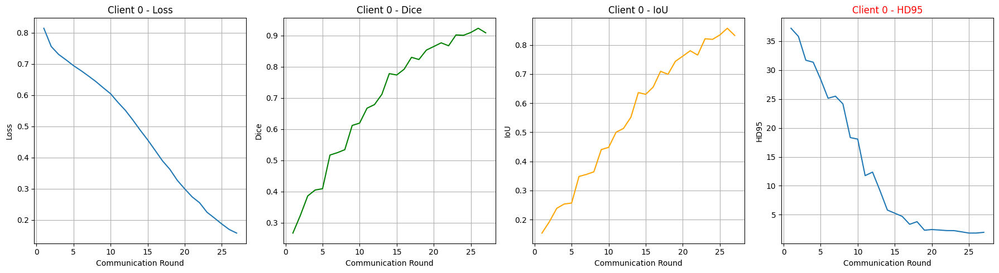

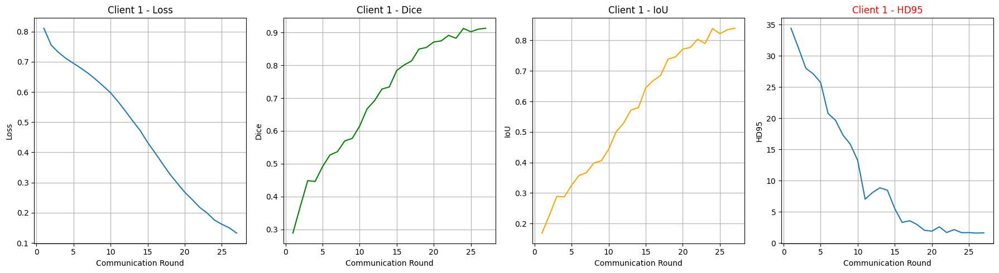

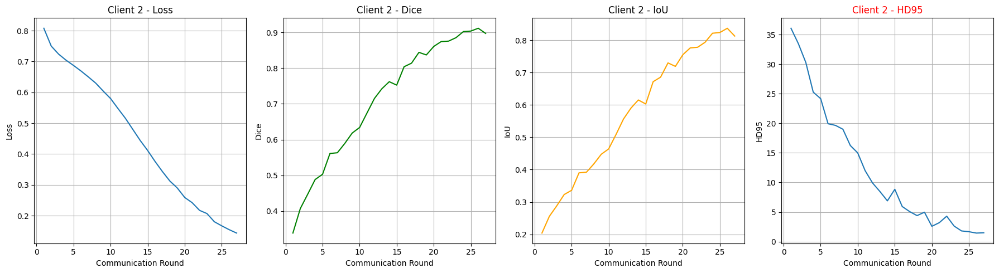

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

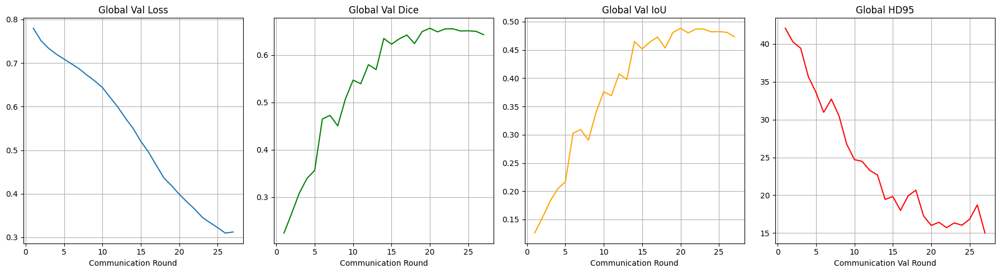

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_3700\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SwinUNETR(
  (swinViT): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv3d(1, 24, kernel_size=(2, 2, 2), stride=(2, 2, 2))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers1): ModuleList(
      (0): BasicLayer(
        (blocks): ModuleList(
          (0-1): 2 x SwinTransformerBlock(
            (norm1): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=24, out_features=72, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=24, out_features=24, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((24,), eps=1e-05, elementwise_affine=True)
            (mlp): MLPBlock(
              (linear1): Linear(in_features=24, out_features=96, bias=True)
              (linear2): Li

Testing:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s, Dice=0.5849, IoU=0.4134, HD95=17.1384]c:\Users\LAB\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s, Dice=0.5259, IoU=0.3567, HD95=18.0863]c:\Users\LAB\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s, Dice=0.6077, IoU=0.4365, HD95=14.4028]


Test Set Metrics:
Dice: 0.6077
IoU: 0.4365
HD95: 14.4028


**Visualize**

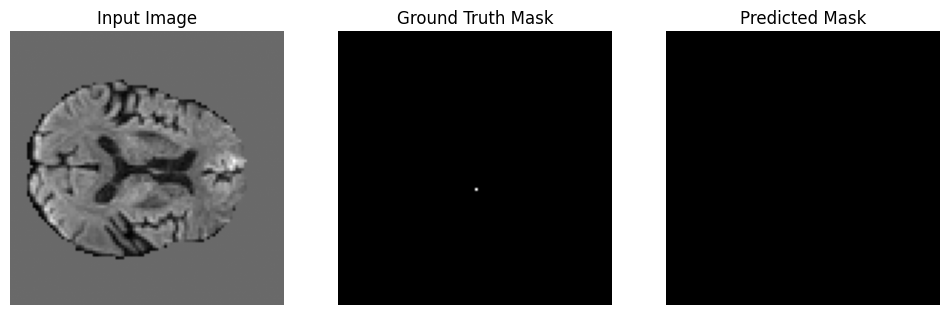

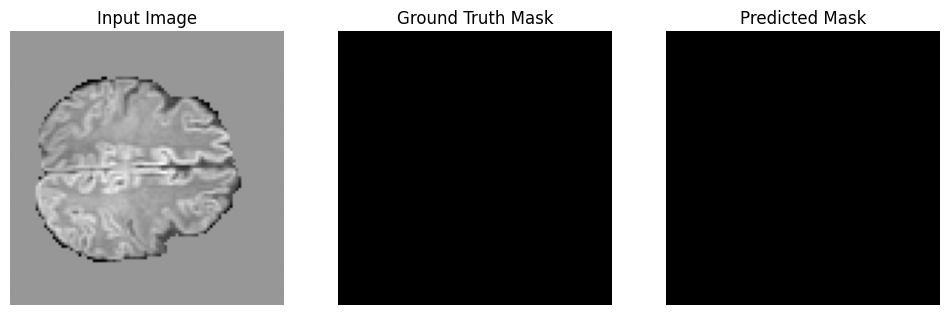

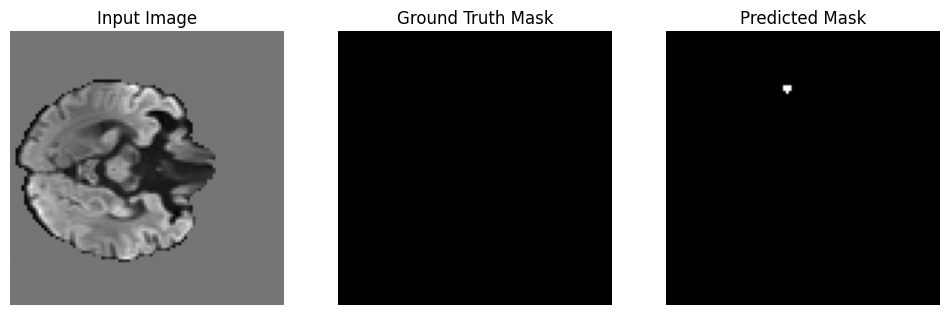

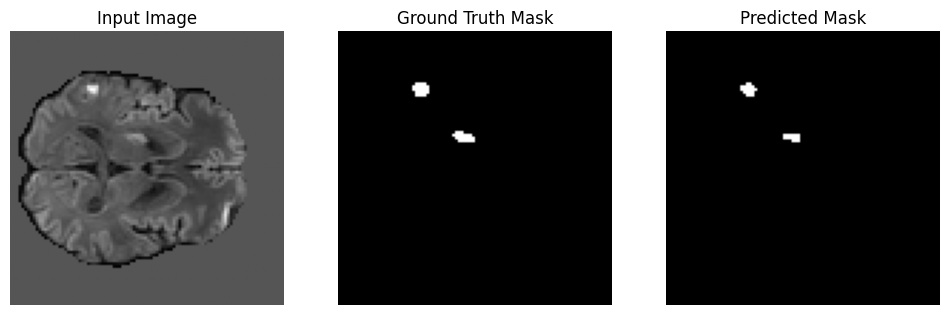

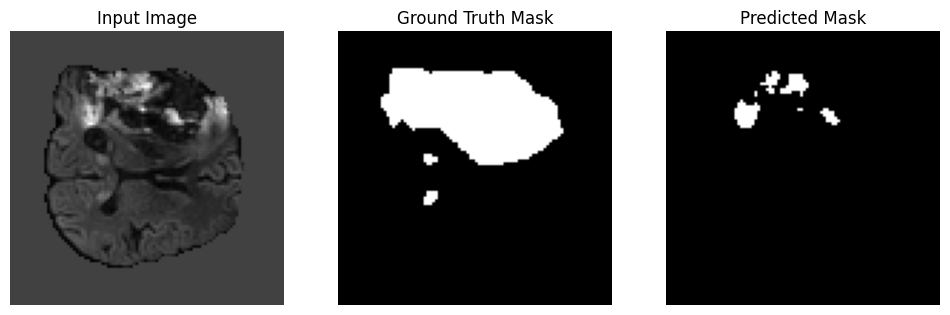

...

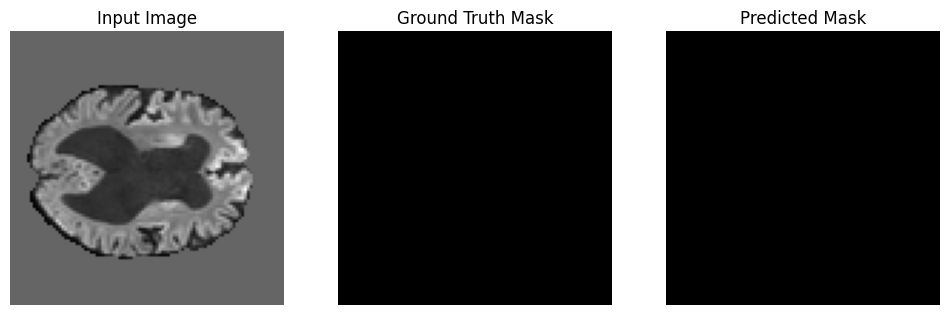

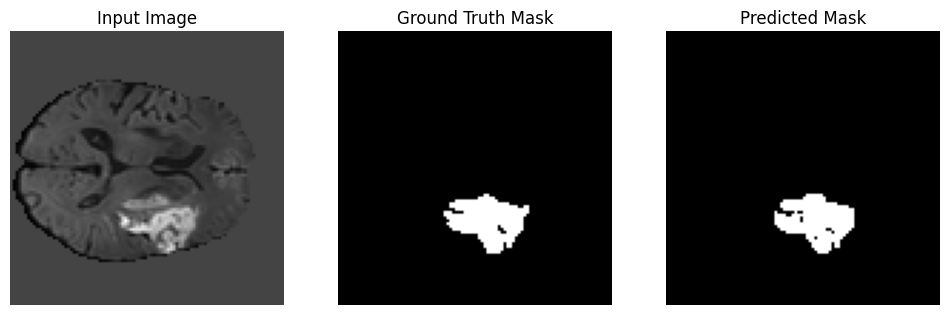

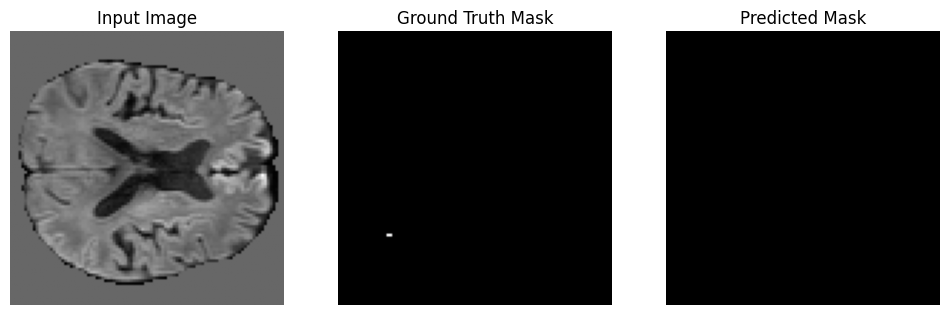

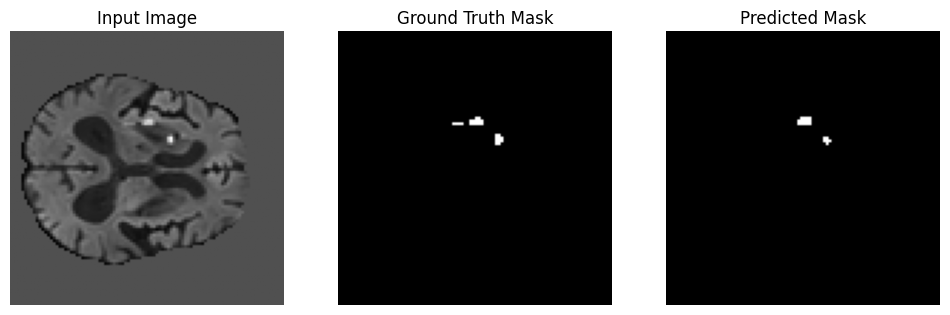

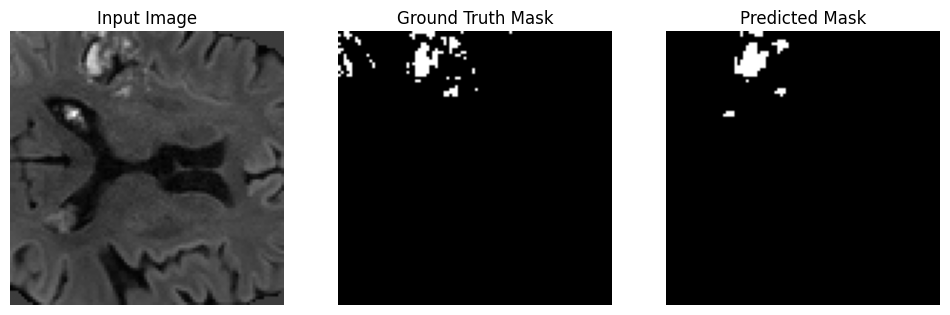

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()